In [1]:
from dtaidistance import dtw

In [2]:
from pathlib2 import Path
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import re
import IPython
import librosa
import librosa.display
from tqdm.autonotebook import tqdm

/home/AD/tsainbur/anaconda3/envs/neuroethology/lib/python3.7/site-packages/ipykernel_launcher.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  if __name__ == '__main__':


In [3]:
DSLOC = Path('/mnt/cube/Datasets/Macaque')

In [4]:
WAVLIST = list((DSLOC / 'dataupload').expanduser().glob('*/*.wav'))

In [5]:
len(WAVLIST)

7285

In [6]:
import amfm_decompy.basic_tools as basic
import amfm_decompy.pYAAPT as pYAAPT

In [7]:
start_freq = 0
end_freq = 40

In [8]:
import crepe

In [9]:
wav_df = pd.DataFrame(
    columns=[
        "loc",
        "indv",
        "idnum",
        "rate",
        "voc_len",
        "crepe_time",
        "crepe_pitch",
        "crepe_confidence",
        "crepe_activation",
        "argmax_pitch",
        "spec"
    ]
)
for wav in tqdm(WAVLIST):
    indv = wav.parent.stem
    idnum = int(wav.stem[2:])
    y, sr = librosa.load(wav)

    # wav_df.loc[len(wav_df)] = [wav, indv, idnum, data, rate, len(data)/rate]

    # plt.plot(data)

    # get pitch
    # signal = basic.SignalObj(wav)
    # pitchY = pYAAPT.yaapt(signal, frame_length=40, tda_frame_length=40, f0_min=400, f0_max=2000)
    # pitch = pitchY.samp_values
    time, pitch, confidence, activation = crepe.predict(
        y, sr, viterbi=True, verbose=False
    )

    # get spec
    D = np.abs(librosa.stft(y, n_fft=512, hop_length=32)) ** 2
    S_dB = librosa.power_to_db(D, ref=np.max)
    spec = S_dB
    
    freq_units = (sr / 2) / spec.shape[0]
    freq = np.argmax(spec, axis=0) * freq_units
    
    wav_df.loc[len(wav_df)] = [wav, indv, idnum, sr, len(y)/sr, time, pitch, confidence, activation, freq, spec]
    
    if False:
        
        fig, ax = plt.subplots(figsize=(4, 4))
        ax.matshow(
            spec[start_freq:end_freq],
            extent=[0, len(y) / sr, freq_units * start_freq, freq_units * end_freq],
            aspect="auto",
            origin="lower",
            cmap="viridis",
        )
        ax.plot(time, pitch, color="red")
        plt.show()

  0%|          | 0/7285 [00:00<?, ?it/s]

/home/AD/tsainbur/anaconda3/envs/neuroethology/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [117]:
sr

22050

In [10]:
wav_df[:3]

,loc,indv,idnum,rate,voc_len,crepe_time,crepe_pitch,crepe_confidence,crepe_activation,argmax_pitch,spec
0,/mnt/cube/Datasets/Macaque/dataupload/IO/IO184...,IO,184,22050,0.298594,"[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07...","[552.8373326396315, 555.2978337098181, 559.636...","[0.6206346, 0.7497932, 0.82392097, 0.8547622, ...","[[4.339139e-06, 4.047887e-06, 3.3005206e-06, 2...","[557.6848249027238, 557.6848249027238, 557.684...","[[-54.626945, -55.52765, -57.536354, -58.92652..."
1,/mnt/cube/Datasets/Macaque/dataupload/IO/IO623...,IO,623,22050,0.347982,"[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07...","[574.7788559794304, 580.3377052714457, 582.303...","[0.71304303, 0.8846096, 0.9487903, 0.9635898, ...","[[3.2847918e-06, 3.86572e-06, 3.7654106e-06, 2...","[557.6848249027238, 557.6848249027238, 557.684...","[[-42.488678, -42.841484, -43.69967, -45.31994..."
2,/mnt/cube/Datasets/Macaque/dataupload/IO/IO997...,IO,997,22050,0.511927,"[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07...","[585.5134107591679, 590.202668966899, 605.4664...","[0.6775801, 0.7440195, 0.7113919, 0.84558344, ...","[[1.2198245e-05, 1.3497475e-05, 1.619941e-05, ...","[514.7859922178989, 514.7859922178989, 514.785...","[[-43.82527, -44.202538, -44.676598, -45.96678..."


In [101]:
np.save('specs.npy', wav_df.spec.values)

In [102]:
np.save('indv.npy', wav_df.indv.values)

In [112]:
crepe_pitch = np.array([np.array(i).astype('float32') for i in wav_df.crepe_pitch.values])

In [113]:
np.save('crepe_pitch2.npy', crepe_pitch)

In [96]:
wav_df.to_pickle('macaque_df2.pickle')

In [11]:
wav_df.to_pickle('macaque_df.pickle')

In [12]:
from dtaidistance import dtw

In [13]:
distance_matrix = dtw.distance_matrix_fast(wav_df.crepe_pitch.values, use_mp=True)

In [14]:
#plt.matshow(ds)

In [15]:
np.save('macaque_distance_matrix.numpy', distance_matrix)

In [17]:
distance_matrix.shape

(7285, 7285)

In [18]:
from sklearn.manifold import MDS

In [20]:
MDS_projection = MDS(dissimilarity="precomputed", n_jobs=-1, verbose=20).fit_transform(distance_matrix)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 48 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done   2 out of   4 | elapsed:  9.2min remaining:  9.2min
[Parallel(n_jobs=-1)]: Done   4 out of   4 | elapsed: 11.9min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   4 out of   4 | elapsed: 11.9min finished


In [23]:
np.save('MDS_projection.numpy', MDS_projection)

In [24]:
import seaborn as sns

In [ ]:
np.unique

In [28]:
cat = wav_df.indv.values
pal = {i:j for i, j in zip(np.unique(cat), sns.color_palette('Set1', len(np.unique(cat))))}
cols = [pal[i] for i in cat]

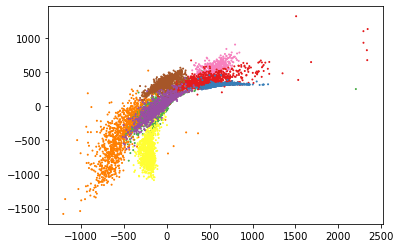

In [31]:
plt.scatter(MDS_projection[:,0], MDS_projection[:,1], c = cols, s=1)

In [32]:
import umap

In [33]:
umap_projections = umap.UMAP(verbose=True, metric = 'precomputed').fit_transform(distance_matrix)

/home/AD/tsainbur/anaconda3/envs/neuroethology/lib/python3.7/site-packages/umap/umap_.py:1736: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  "using precomputed metric; transform will be unavailable for new data and inverse_transform "


UMAP(dens_frac=0.0, dens_lambda=0.0, metric='precomputed', verbose=True)
Construct fuzzy simplicial set
Fri Jul 23 10:02:57 2021 Finding Nearest Neighbors
Fri Jul 23 10:03:01 2021 Finished Nearest Neighbor Search
Fri Jul 23 10:03:05 2021 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Fri Jul 23 10:03:18 2021 Finished embedding


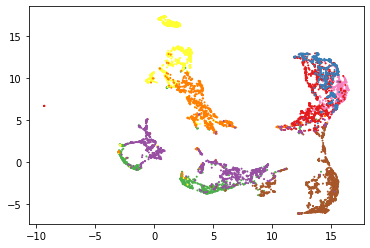

In [34]:
plt.scatter(umap_projections[:,0], umap_projections[:,1], c = cols, s=1)

  0%|          | 0/7285 [00:00<?, ?it/s]

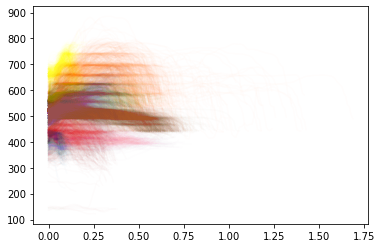

In [37]:
fig, ax = plt.subplots()
for idx, row in tqdm(wav_df.iterrows(), total = len(wav_df)):
    ax.plot(row.crepe_time, row.crepe_pitch, color=pal[row.indv], alpha = 0.01)

In [38]:
wav_df[:3]

,loc,indv,idnum,rate,voc_len,crepe_time,crepe_pitch,crepe_confidence,crepe_activation,argmax_pitch,spec
0,/mnt/cube/Datasets/Macaque/dataupload/IO/IO184...,IO,184,22050,0.298594,"[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07...","[552.8373326396315, 555.2978337098181, 559.636...","[0.6206346, 0.7497932, 0.82392097, 0.8547622, ...","[[4.339139e-06, 4.047887e-06, 3.3005206e-06, 2...","[557.6848249027238, 557.6848249027238, 557.684...","[[-54.626945, -55.52765, -57.536354, -58.92652..."
1,/mnt/cube/Datasets/Macaque/dataupload/IO/IO623...,IO,623,22050,0.347982,"[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07...","[574.7788559794304, 580.3377052714457, 582.303...","[0.71304303, 0.8846096, 0.9487903, 0.9635898, ...","[[3.2847918e-06, 3.86572e-06, 3.7654106e-06, 2...","[557.6848249027238, 557.6848249027238, 557.684...","[[-42.488678, -42.841484, -43.69967, -45.31994..."
2,/mnt/cube/Datasets/Macaque/dataupload/IO/IO997...,IO,997,22050,0.511927,"[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07...","[585.5134107591679, 590.202668966899, 605.4664...","[0.6775801, 0.7440195, 0.7113919, 0.84558344, ...","[[1.2198245e-05, 1.3497475e-05, 1.619941e-05, ...","[514.7859922178989, 514.7859922178989, 514.785...","[[-43.82527, -44.202538, -44.676598, -45.96678..."


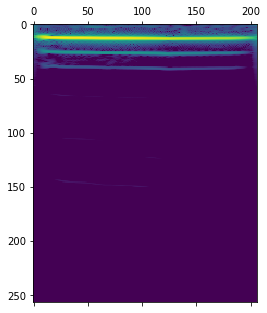

In [40]:
plt.matshow(wav_df.spec[0])

In [80]:
wav_df.spec[0]

array([[-54.626945, -55.52765 , -57.536354, ..., -52.94272 , -51.285896,
        -50.50724 ],
       [-54.78128 , -54.501404, -55.177483, ..., -52.31568 , -50.61129 ,
        -49.66279 ],
       [-49.152397, -50.026024, -50.669807, ..., -51.375854, -50.584393,
        -50.197662],
       ...,
       [-80.      , -80.      , -80.      , ..., -80.      , -80.      ,
        -80.      ],
       [-80.      , -80.      , -80.      , ..., -80.      , -80.      ,
        -80.      ],
       [-80.      , -80.      , -80.      , ..., -80.      , -80.      ,
        -80.      ]], dtype=float32)

In [47]:
spec_lens = [i.shape[1] for i in wav_df.spec.values]

(array([2.360e+03, 1.803e+03, 1.581e+03, 1.269e+03, 2.290e+02, 2.300e+01,
        9.000e+00, 6.000e+00, 4.000e+00, 1.000e+00]),
 array([  29. ,  142.7,  256.4,  370.1,  483.8,  597.5,  711.2,  824.9,
         938.6, 1052.3, 1166. ]),
 <BarContainer object of 10 artists>)

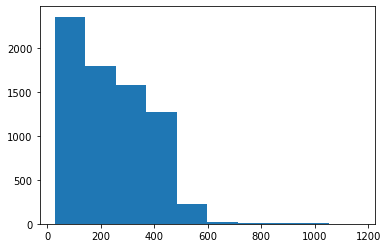

In [48]:
plt.hist(spec_lens)

In [49]:
def pad_spectrogram(spectrogram, pad_length):
    """ Pads a spectrogram to being a certain length
    """
    excess_needed = pad_length - np.shape(spectrogram)[1]
    pad_left = np.floor(float(excess_needed) / 2).astype("int")
    pad_right = np.ceil(float(excess_needed) / 2).astype("int")
    return np.pad(
        spectrogram, [(0, 0), (pad_left, pad_right)], "constant", constant_values=0
    )

In [66]:
specs = [i[:40,:] for i in tqdm(wav_df.spec.values)]

  0%|          | 0/7285 [00:00<?, ?it/s]

In [69]:
import pdb
from joblib import Parallel, delayed
n_jobs = 10
verbosity = 5

In [70]:
from PIL import Image 
def log_resize_spec(spec, spec_len_mul=20, freq_bins = 64):
    resize_shape = [int(np.log(np.shape(spec)[1])*spec_len_mul), freq_bins]
    resize_spec = np.array(Image.fromarray(spec).resize(resize_shape, Image.ANTIALIAS))
    return resize_spec


In [72]:
with Parallel(n_jobs=1, verbose=verbosity) as parallel:
    specs_resized = parallel(
        delayed(log_resize_spec)(spec)
        for spec in tqdm(
            specs
        )
    )

  0%|          | 0/7285 [00:00<?, ?it/s]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 7285 out of 7285 | elapsed:   15.6s finished


In [85]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

In [86]:
specs_resized_norm = [norm(i) for i in tqdm(specs_resized)]

In [88]:
spec_lens = [i.shape[1] for i in specs_resized_norm]

In [89]:
with Parallel(n_jobs=1, verbose=verbosity) as parallel:
    specs_padded = parallel(
        delayed(pad_spectrogram)(spec, np.max(spec_lens))
        for spec in tqdm(
            specs_resized_norm
        )
    )

  0%|          | 0/7285 [00:00<?, ?it/s]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 7285 out of 7285 | elapsed:   15.6s finished


In [90]:
specs_padded = np.array(specs_padded)
specs_padded.shape

(7285, 64, 141)

In [91]:
def plot_voc_canvas(specs_padded, nrow = 6, ncol = 20, zoom = 2):
    """
    """
    dimx = np.shape(specs_padded[0])[0]
    dimy = np.shape(specs_padded[0])[1]

    canvas = np.zeros((nrow*dimx, ncol*dimy))
    cn = 0
    for row in range(nrow)[::-1]:
        for col in range(ncol):
            canvas[dimx*row:dimx*(row+1), dimy*col:dimy*(col+1)] = specs_padded[cn]
            cn += 1

    fig, ax = plt.subplots(figsize=(ncol*zoom*2, nrow*zoom))
    ax.matshow(canvas, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
    ax.axis('off')
    plt.show()

AL


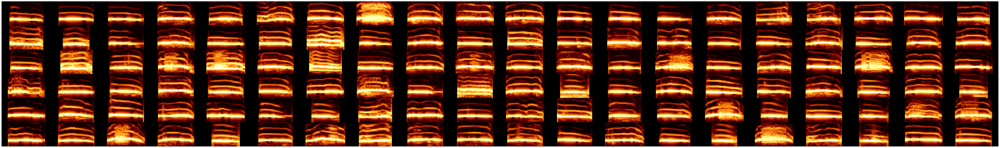

BE


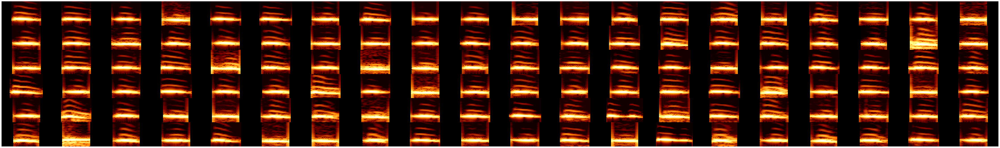

IO


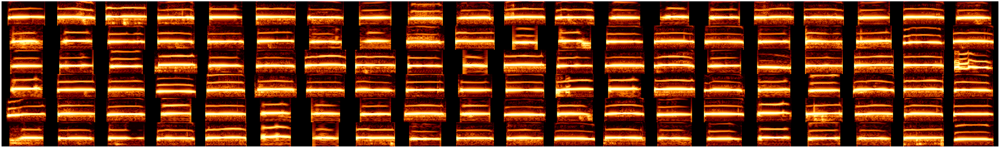

MU


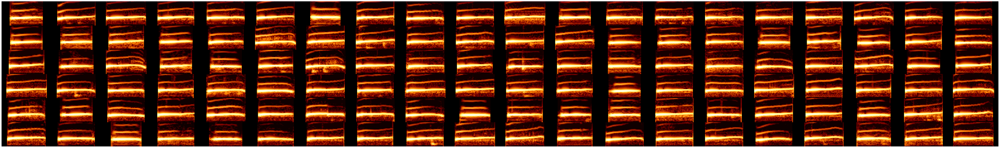

QU


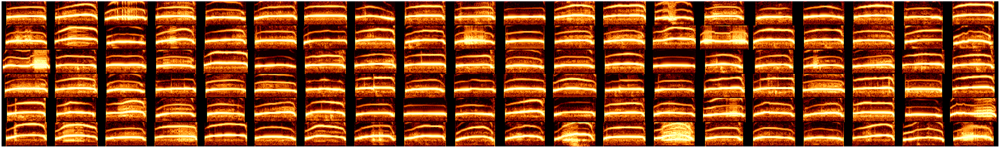

SN


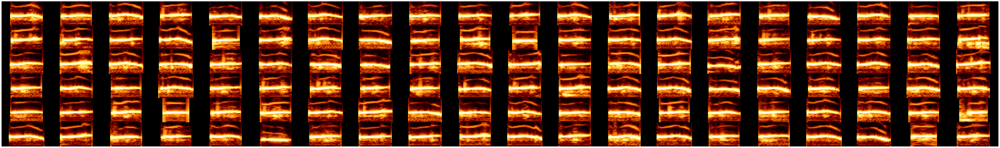

TH


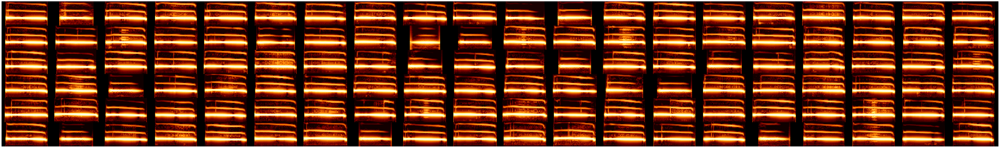

TW


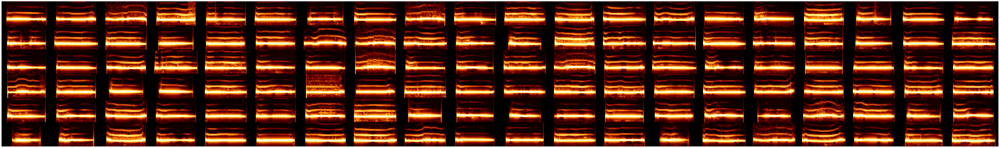

In [92]:
for indv in np.unique(wav_df.indv):
    
    print(indv)
    plot_voc_canvas(specs_padded[
        (wav_df.indv == indv)
    ])

In [93]:
import umap
import seaborn as sns

In [94]:
specs = np.stack(specs_padded, axis=2).T
specs_flattened = np.reshape(specs, (np.shape(specs)[0], np.prod(np.shape(specs)[1:])))
len(specs_flattened)

7285

In [115]:
np.shape(specs_flattened)

(7285, 9024)

In [116]:
spec_umap = umap.UMAP(verbose=True).fit_transform(specs_flattened)

UMAP(dens_frac=0.0, dens_lambda=0.0, verbose=True)
Construct fuzzy simplicial set
Fri Jul 23 11:31:59 2021 Finding Nearest Neighbors
Fri Jul 23 11:31:59 2021 Building RP forest with 9 trees


KeyboardInterrupt: 

In [ ]:
plt.scatter(spec_umap[:,0], spec_umap[:,1], c = cols, s=1)